# A ideia é ver a distância dos starbucks pro Metrô usando OSMnx, Geopandas, Geocoding

In [1]:
import geopandas as gpd
from geopandas.tools import geocode
import geopy
import pandas as pd
import folium

In [2]:
loc = pd.read_csv('starbucks.csv', sep = ';')

In [4]:
loc.head()

,endereco
0,"Avenida das Americas, 5000, Rio de Janeiro"
1,"Avenida Ayrton Senna, 3000, Rio de Janeiro"
2,"Avenida das Americas, 4666, Rio de Janeiro"
3,"Avenida das Americas, 3900, Rio de Janeiro"
4,"Avenida das Americas, 500, Rio de Janeiro"


In [4]:
def custom_geocoder(address):
    dataframe = geocode(address , provider="nominatim" , user_agent = 'my_request')
    point = dataframe.geometry.iloc[0]
    return pd.Series({'Latitude': point.y, 'Longitude': point.x})

for i in loc['endereco']:
    custom_geocoder(i)
   
    
    

In [5]:
loc.head()

,endereco
0,"Avenida das Americas, 5000, Rio de Janeiro"
1,"Avenida Ayrton Senna, 3000, Rio de Janeiro"
2,"Avenida das Americas, 4666, Rio de Janeiro"
3,"Avenida das Americas, 3900, Rio de Janeiro"
4,"Avenida das Americas, 500, Rio de Janeiro"


In [6]:
loc.drop(columns = {'lat','long'}, inplace = True)
loc.to_csv('starbucks_loc.csv')

KeyError: "['long' 'lat'] not found in axis"

In [24]:
df = pd.read_csv('starbucks_loc.csv')
df_metro = pd.read_csv('metro_station.csv')

In [28]:
df_metro.head()

,OBJECTID,Cod,Nome,Flg_ATM,Flg_Bicicl,Flg_Elevad,Flg_Linha1,Flg_Linha2,Obs,Flg_Ativa,...,Integra_On,Integra_BR,Corredor,Integra_VL,Onibus,Flg_Metro_,Metro_Supe,Data_Inaug,X,Y
0,1,1,Pavuna,Sim,Sim,Sim,Não,Sim,NaN,Sim,...,Não,Não,NaN,Não,NaN,Não,NaN,1998,-43.365,-22.807
1,2,2,Engenheiro Rubens Paiva,Sim,Sim,Sim,Não,Sim,NaN,Sim,...,Não,Não,NaN,Não,NaN,Não,NaN,1998,-43.358,-22.816
2,3,3,Acari / Fazenda Botafogo,Não,Não,Não,Não,Sim,NaN,Sim,...,Não,Não,NaN,Não,NaN,Não,NaN,1998,-43.350,-22.825
3,4,4,Coelho Neto,Sim,Não,Não,Não,Sim,NaN,Sim,...,Não,Não,NaN,Não,NaN,Não,NaN,1998,-43.343,-22.831
4,5,5,Colégio,Sim,Sim,Não,Não,Sim,NaN,Sim,...,Não,Não,NaN,Não,NaN,Não,NaN,1998,-43.334,-22.843


In [32]:
gdf = gpd.GeoDataFrame(df, geometry = gpd.points_from_xy(df['latitude'], df['longitude']))
metro = gpd.GeoDataFrame(df_metro, geometry = gpd.points_from_xy(df_metro['Y'], df_metro['X']))

In [34]:
metro.head()

,OBJECTID,Cod,Nome,Flg_ATM,Flg_Bicicl,Flg_Elevad,Flg_Linha1,Flg_Linha2,Obs,Flg_Ativa,...,Integra_BR,Corredor,Integra_VL,Onibus,Flg_Metro_,Metro_Supe,Data_Inaug,X,Y,geometry
0,1,1,Pavuna,Sim,Sim,Sim,Não,Sim,NaN,Sim,...,Não,NaN,Não,NaN,Não,NaN,1998,-43.365,-22.807,POINT (-22.80700 -43.36500)
1,2,2,Engenheiro Rubens Paiva,Sim,Sim,Sim,Não,Sim,NaN,Sim,...,Não,NaN,Não,NaN,Não,NaN,1998,-43.358,-22.816,POINT (-22.81600 -43.35800)
2,3,3,Acari / Fazenda Botafogo,Não,Não,Não,Não,Sim,NaN,Sim,...,Não,NaN,Não,NaN,Não,NaN,1998,-43.350,-22.825,POINT (-22.82500 -43.35000)
3,4,4,Coelho Neto,Sim,Não,Não,Não,Sim,NaN,Sim,...,Não,NaN,Não,NaN,Não,NaN,1998,-43.343,-22.831,POINT (-22.83100 -43.34300)
4,5,5,Colégio,Sim,Sim,Não,Não,Sim,NaN,Sim,...,Não,NaN,Não,NaN,Não,NaN,1998,-43.334,-22.843,POINT (-22.84300 -43.33400)


In [56]:
gdf.head(10)

,Unnamed: 0,endereco,latitude,longitude,geometry
0,0,"Avenida das Americas, 5000, Rio de Janeiro",-22.998772,-43.360521,POINT (-22.99877 -43.36052)
1,1,"Avenida Ayrton Senna, 3000, Rio de Janeiro",-22.983145,-43.362847,POINT (-22.98314 -43.36285)
2,2,"Avenida das Americas, 4666, Rio de Janeiro",-22.997785,-43.358331,POINT (-22.99778 -43.35833)
3,3,"Avenida das Americas, 3900, Rio de Janeiro",-22.998154,-43.351263,POINT (-22.99815 -43.35126)
4,4,"Avenida das Americas, 500, Rio de Janeiro",-23.002969,-43.317096,POINT (-23.00297 -43.31710)
5,5,"Avenida Dom Helder Camara, 5080, Rio de Janeiro",-22.892725,-43.239719,POINT (-22.89272 -43.23972)
6,6,"Avenida Pastor Martin Luther King Junior, 126,...",-22.875949,-43.271679,POINT (-22.87595 -43.27168)
7,7,"Avenida Maracana, 987, Rio de Janeiro",-22.921856,-43.235146,POINT (-22.92186 -43.23515)
8,8,"Avenida Afranio de Melo Franco, 290, Rio de Ja...",-22.982285,-43.216875,POINT (-22.98228 -43.21688)
9,9,"Avenida Vinte de Janeiro, S/N, Rio de Janeiro",-22.807232,-43.254543,POINT (-22.80723 -43.25454)


In [35]:
mapit = folium.Map( location=[-22.9, -43.3], zoom_start=11)

#You Markler the point in Map
for indice, row in gdf.iterrows():
    folium.Marker(
        location=[row["latitude"], row["longitude"]],
        popup=row['endereco'],
        icon=folium.map.Icon(color='green')
    ).add_to(mapit)
    
for indice, row in metro.iterrows():
    folium.Marker(
        location=[row["Y"], row["X"]],
        popup=row['Nome'],
        icon=folium.map.Icon(color='blue')
    ).add_to(mapit)

    
mapit

In [65]:
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon
from datetime import datetime
ox.config(log_console=True, use_cache=True)
ox.__version__

'1.1.0'

In [13]:
# configure the place, network type, trip times, and travel speed
place = (-22.964904406414266, -43.27486828516341) #Alto da Boa Vista
network_type = 'walk'
trip_times = [5, 10, 15, 20, 25] #in minutes
travel_speed = 4.5 #walking speed in km/hour

In [14]:
def create_graph(loc, dist, transport_mode, loc_type="address"):
    # Transport mode = ‘walk’, ‘bike’, ‘drive’, ‘drive_service’, ‘all’, ‘all_private’, ‘none’
    if loc_type == "address":
        G = ox.graph_from_address(loc, dist=dist, network_type=transport_mode)
    elif loc_type == "points":
        G = ox.graph_from_point(loc, dist=dist, network_type=transport_mode )
    return G

In [23]:
lugar = str(gdf['latitude'][0], gdf['longitude'][0])

TypeError: str() argument 2 must be str, not numpy.float64

E vamos de Starbucks do Avenida das Americas, 5000, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Ayrton Senna, 3000, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida das Americas, 4666, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida das Americas, 3900, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida das Americas, 500, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Dom Helder Camara, 5080, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Pastor Martin Luther King Junior, 126, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Maracana, 987, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Afranio de Melo Franco, 290, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Vinte de Janeiro, S/N, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Rua Visconde de Piraja, 206, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Nossa Senhora de Copacabana, 1058, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Rua Voluntarios da Patria, 89, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Praia de Botafogo, 400, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Praia de Botafogo, 228, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Lauro Sodre, 445, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Avenida Rio Branco, 143, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Praca Floriano, 7, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Rua do Carmo, 11, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Praca Senador Salgado Filho, S/N, Rio de Janeiro
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.
Agora vou salvar a imagem
E vamos de Starbucks do Rua Quinze de Novembro, 8, Niteroi
Dados da área já foram coletados.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


Os nódulos já foram coletados.
O tempo e velocidade de viagem já foram definidos.
A cor para as isócronas já foi definida
A correlação entre os nódulos e as isócronas já foi feita.
Os polígonos das isócronas já foram feitos.


C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\plot.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize, facecolor=bgcolor, frameon=False)


Agora vou salvar a imagem
Wall time: 5min 48s


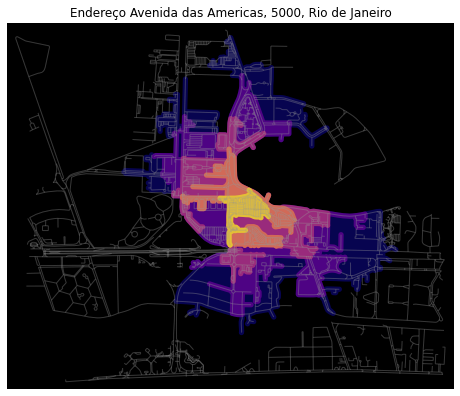

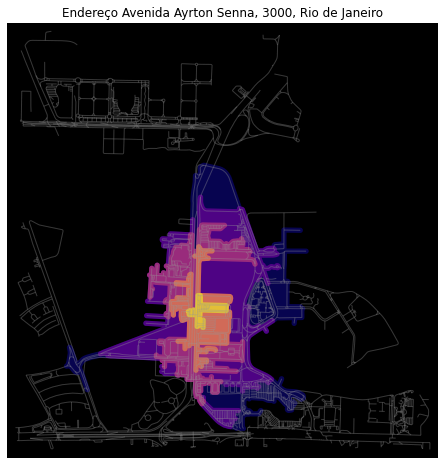

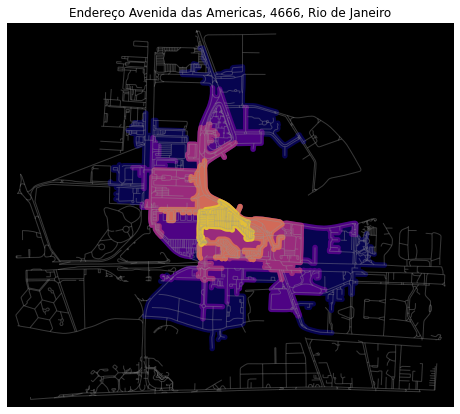

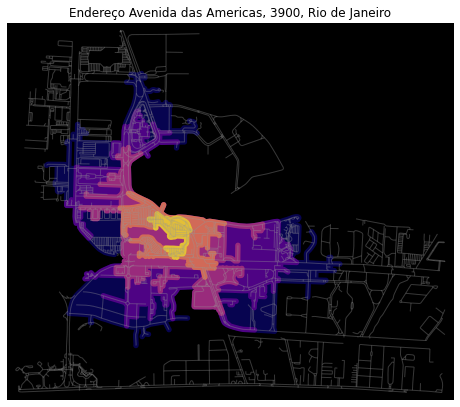

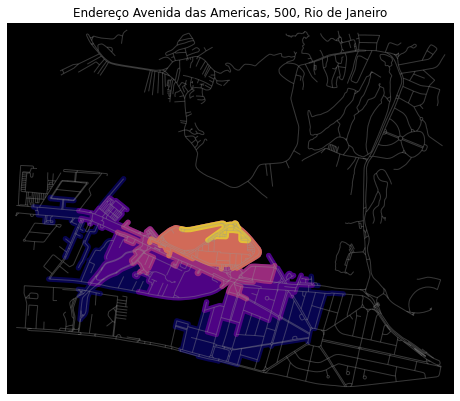

...

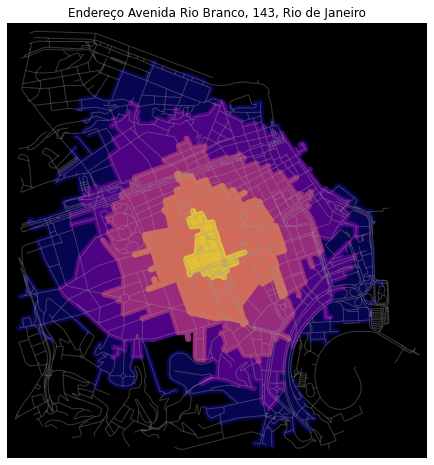

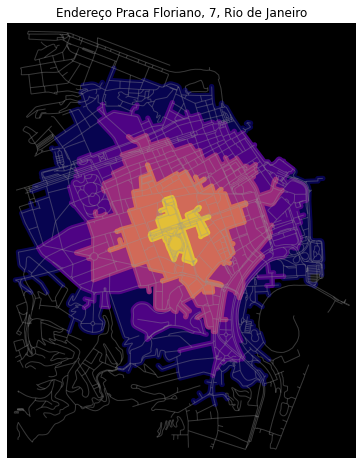

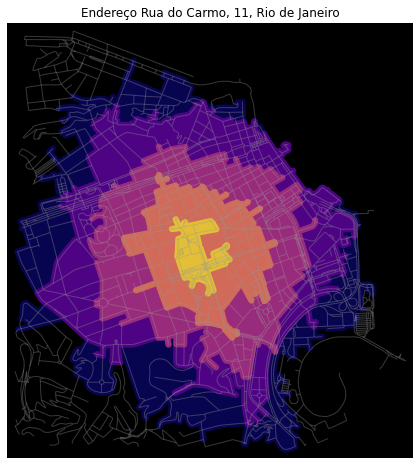

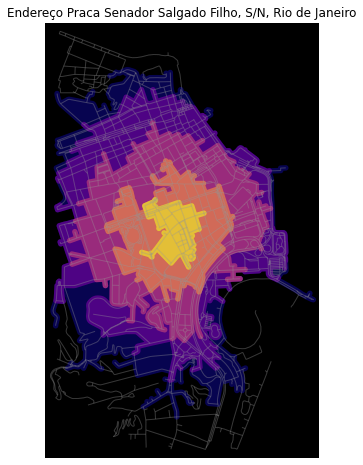

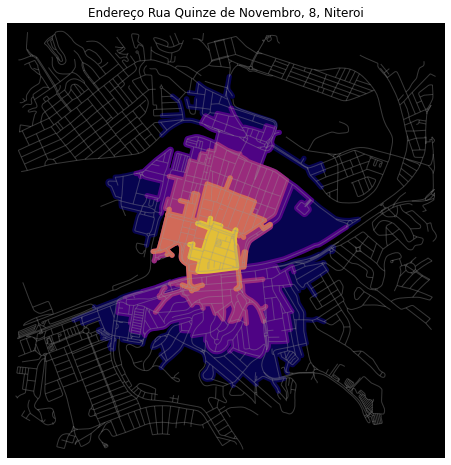

In [69]:
%%time
for x,y,z in zip(gdf['latitude'], gdf['longitude'], gdf['endereco']):
    print('E vamos de Starbucks do {}'.format(z))
    
    G = create_graph((x,y), dist=2000, transport_mode='walk', loc_type = 'points')
    
    print('Dados da área já foram coletados.')
    
    # find the centermost node and then project the graph to UTM
    gdf_nodes = ox.graph_to_gdfs(G, edges=False) 
    x, y = gdf_nodes['geometry'].unary_union.centroid.xy
    center_node = ox.get_nearest_node(G, (y[0], x[0]))
    G2 = ox.project_graph(G)
    print('Os nódulos já foram coletados.')
    
    # add an edge attribute for time in minutes required to traverse each edge
    meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute
    for u, v, k, data in G2.edges(data=True, keys=True):
        data['time'] = data['length'] / meters_per_minute
    print('O tempo e velocidade de viagem já foram definidos.')
    
    # get one color for each isochrone
    iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)
    print('A cor para as isócronas já foi definida')
    
    # color the nodes according to isochrone then plot the street network
    node_colors = {}
    for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
        subgraph = nx.ego_graph(G2, center_node, radius=trip_time, distance='time')
        for node in subgraph.nodes():
            node_colors[node] = color
    nc = [node_colors[node] if node in node_colors else 'none' for node in G2.nodes()]
    ns = [15 if node in node_colors else 0 for node in G2.nodes()]
    print('A correlação entre os nódulos e as isócronas já foi feita.')
    
    # make the isochrone polygons
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G2, center_node, radius=trip_time, distance='time')
        node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
        bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
        isochrone_polys.append(bounding_poly)
    print('Os polígonos das isócronas já foram feitos.')
    
    #Criando as isócronas e removendo o excesso
    isochrone_polys = make_iso_polys(G2, edge_buff=25, node_buff=0, infill=True)
    fig, ax = ox.plot_graph(G2, show=False, close=False, edge_color='#999999', edge_alpha=0.2,
                            node_size=0, bgcolor='k')
    for polygon, fc in zip(isochrone_polys, iso_colors):
        patch = PolygonPatch(polygon, fc=fc, ec='none', alpha=0.6, zorder=-1)
        ax.add_patch(patch)
    plt.title('Endereço {}'.format(z))
    print('Agora vou salvar a imagem')
    plt.savefig('starbucks_{}.png'.format(datetime.now().strftime("%Y-%m-%d-%H-%M-%m")))

In [60]:
gdf.index

RangeIndex(start=0, stop=21, step=1)

In [38]:
ox.plot_graph_folium(G)

In [43]:
# find the centermost node and then project the graph to UTM
gdf_nodes = ox.graph_to_gdfs(G, edges=False)
x, y = gdf_nodes['geometry'].unary_union.centroid.xy
center_node = ox.get_nearest_node(G, (y[0], x[0]))
G2 = ox.project_graph(G)

C:\Users\Samsung\anaconda3\envs\geoenv\lib\site-packages\osmnx\distance.py:347: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


In [44]:
# add an edge attribute for time in minutes required to traverse each edge
meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute
for u, v, k, data in G2.edges(data=True, keys=True):
    data['time'] = data['length'] / meters_per_minute

In [45]:
# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)

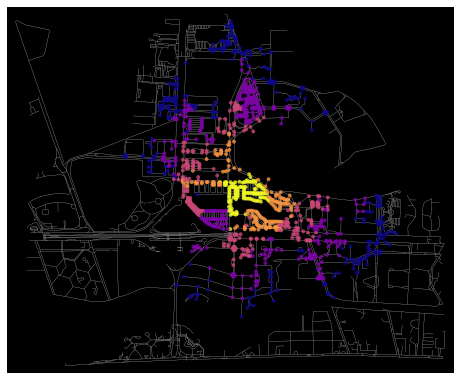

In [46]:
# color the nodes according to isochrone then plot the street network
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G2, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G2.nodes()]
ns = [15 if node in node_colors else 0 for node in G2.nodes()]
fig, ax = ox.plot_graph(G2, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2,
                        bgcolor='k', edge_linewidth=0.2, edge_color='#999999')

In [47]:
# make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G2, center_node, radius=trip_time, distance='time')
    node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    isochrone_polys.append(bounding_poly)

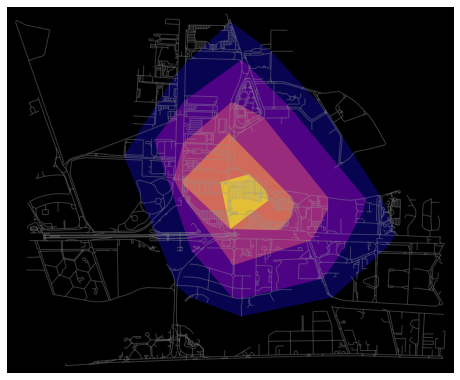

In [48]:

# plot the network then add isochrones as colored descartes polygon patches
fig, ax = ox.plot_graph(G2, show=False, close=False, edge_color='#999999', edge_alpha=0.2,
                        node_size=0, bgcolor='k')
for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = PolygonPatch(polygon, fc=fc, ec='none', alpha=0.6, zorder=-1)
    ax.add_patch(patch)
plt.show()

In [49]:
def make_iso_polys(G, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G2, center_node, radius=trip_time, distance='time')

        node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
        nodes_gdf = gpd.GeoDataFrame({'id': subgraph.nodes()}, geometry=node_points)
        nodes_gdf = nodes_gdf.set_index('id')

        edge_lines = []
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr].geometry
            t = nodes_gdf.loc[n_to].geometry
            edge_lookup = G2.get_edge_data(n_fr, n_to)[0].get('geometry',  LineString([f,t]))
            edge_lines.append(edge_lookup)

        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union
        
        # try to fill in surrounded areas so shapes will appear solid and blocks without white space inside them
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)
    return isochrone_polys


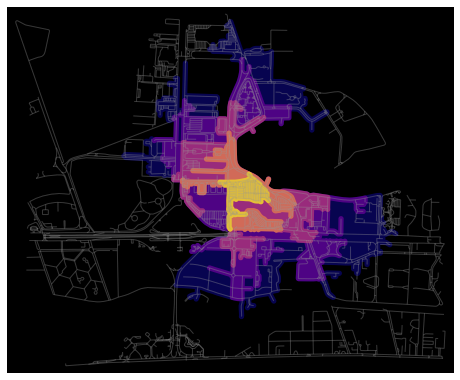

In [55]:
isochrone_polys = make_iso_polys(G2, edge_buff=25, node_buff=0, infill=True)
fig, ax = ox.plot_graph(G2, show=False, close=False, edge_color='#999999', edge_alpha=0.2,
                        node_size=0, bgcolor='k')
for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = PolygonPatch(polygon, fc=fc, ec='none', alpha=0.6, zorder=-1)
    ax.add_patch(patch)
plt.show()

In [51]:
ox.io.save_graph_geopackage(G2, encoding = 'utf-8')

# Coisas a se fazer depois

- Aranjar uma forma de colocar os pontos do metrô no polígono de tempo.
- Colocar legenda no mapa
- Salvar as imagens todas
- Ver se há correlação entre outros indicadores: renda per capita, concentração de pessoas, número de pessoas que transitam por ali.
- Tentar validar com as lojas de SP


Tutoriais: https://geoffboeing.com/2018/03/osmnx-features-roundup/